<a href="https://colab.research.google.com/github/pusatalamsemestaa/Machine-Learning/blob/main/ML_PBL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
! pip install -q kaggle

In [4]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [5]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [44]:
# Pastikan Anda telah me-mount Drive di awal:
# from google.colab import drive
drive.mount('/content/drive')

# --- KODE YANG DIPERBAIKI ---
# data_dir diarahkan ke folder yang berisi FOLDER KELAS (Caju seed 1, Cici seed 1, dll.)
data_dir = '/content/drive/MyDrive/ML /dataset PBL/Training/kacang'

datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2 # 80% training, 20% validation
)

train_data = datagen.flow_from_directory(
    data_dir,
    target_size=(128, 128),   # ubah ukuran citra
    batch_size=32,
    class_mode='categorical', # untuk klasifikasi multi-kelas
    subset='training'
)

val_data = datagen.flow_from_directory(
    data_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 3405 images belonging to 8 classes.
Found 847 images belonging to 8 classes.


In [45]:
print(train_data.class_indices)


{'Caju seed 1': 0, 'Chestnut 1': 1, 'Cocos 1': 2, 'Hazelnut 1': 3, 'Nut Forest 1': 4, 'Nut Pecan 1': 5, 'Pistachio 1': 6, 'Walnut 1': 7}


Kelas yang ditemukan: ['Caju seed 1', 'Chestnut 1', 'Cocos 1', 'Hazelnut 1', 'Nut Forest 1', 'Nut Pecan 1', 'Pistachio 1', 'Walnut 1']


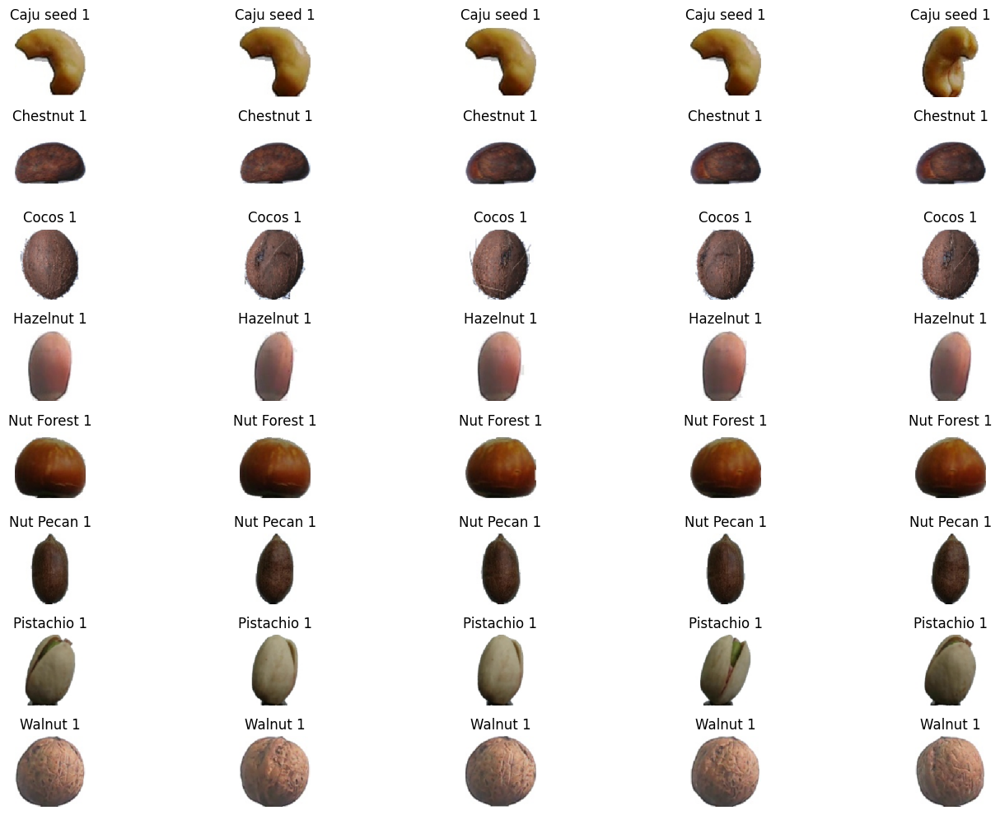

In [49]:
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras.preprocessing import image

# Folder utama dataset
base_dir = '/content/drive/MyDrive/ML /dataset PBL/Training/kacang'

# Daftar nama kelas (folder)
classes = os.listdir(base_dir)
print("Kelas yang ditemukan:", classes)

# Jumlah contoh yang ingin ditampilkan per kelas
num_images = 5

plt.figure(figsize=(15, 10))

for i, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, class_name)
    # Ambil hanya sejumlah gambar yang ditentukan
    image_files = os.listdir(class_path)[:num_images]

    for j, img_name in enumerate(image_files):
        img_path = os.path.join(class_path, img_name)

        # 1. Memuat Gambar dan Mengubah Ukuran
        img = image.load_img(img_path, target_size=(128, 128))

        # 2. Konversi ke Array NumPy (Nilai piksel 0-255)
        img_array = image.img_to_array(img)

        # 3. Normalisasi Eksplisit: Mengubah rentang nilai piksel dari 0-255 menjadi 0.0-1.0
        # Normalisasi ini penting untuk pelatihan model Deep Learning yang stabil.
        img_array = img_array / 255.0

        plt.subplot(len(classes), num_images, i*num_images + j + 1)
        plt.imshow(img_array)
        plt.title(class_name)
        plt.axis('off')

plt.tight_layout()
plt.show()

Kelas yang ditemukan: ['Cantaloupe 1', 'Cantaloupe 2', 'Melon Piel de Sapo 1']


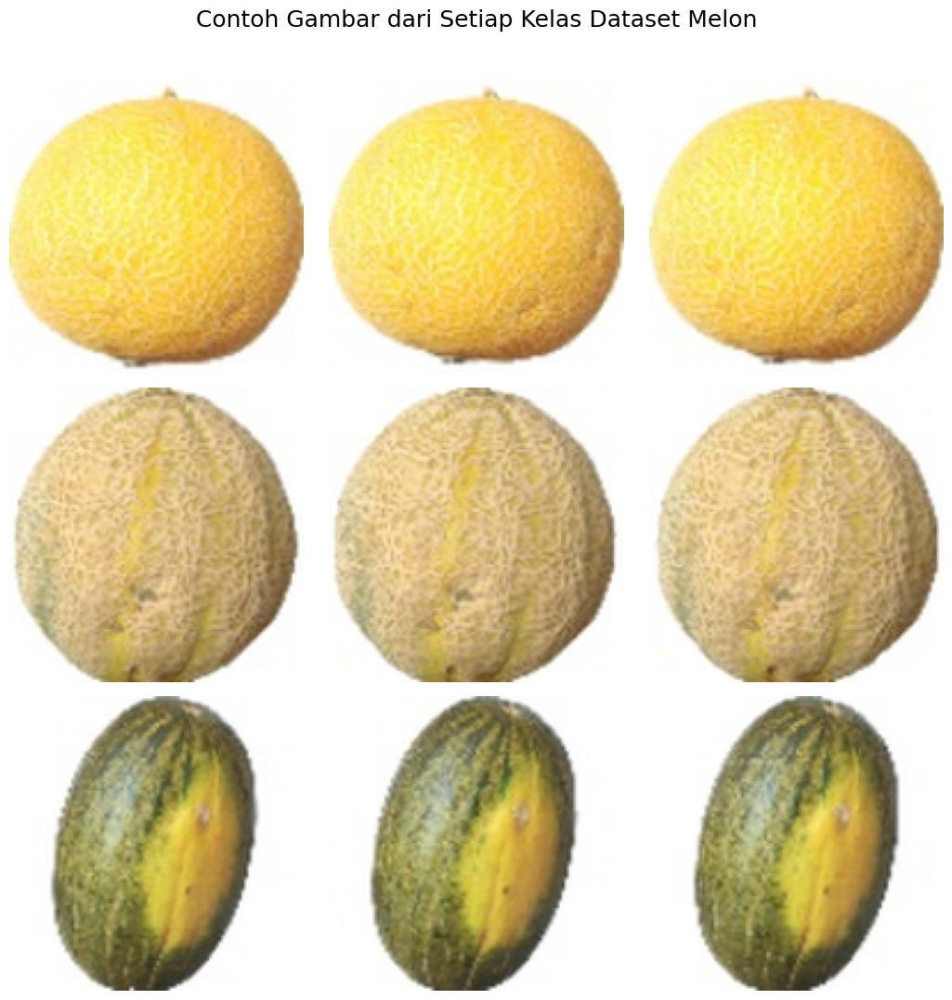

In [60]:
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras.preprocessing import image
from PIL import Image

# Folder utama dataset
base_dir = '/content/drive/MyDrive/ML /dataset PBL/Training/melon'  # pastikan path tidak ada spasi yang salah

# Daftar nama kelas (folder)
classes = sorted(os.listdir(base_dir))
print("Kelas yang ditemukan:", classes)

# Jumlah contoh yang ingin ditampilkan per kelas
num_images = 3

# Ukuran figur lebih besar untuk kualitas tampilan yang lebih baik
plt.figure(figsize=(num_images * 3.5, len(classes) * 3.5))

for i, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, class_name)
    image_files = sorted(os.listdir(class_path))[:num_images]

    for j, img_name in enumerate(image_files):
        img_path = os.path.join(class_path, img_name)

        # --- Memuat gambar menggunakan PIL agar bisa pakai antialias ---
        img = Image.open(img_path).convert('RGB')
        img = img.resize((128, 128), Image.Resampling.LANCZOS)  # resize dengan kualitas tinggi

        # --- Konversi ke array dan normalisasi ---
        img_array = np.array(img) / 255.0

        # --- Plot ---
        ax = plt.subplot(len(classes), num_images, i * num_images + j + 1)
        plt.imshow(img_array)
        plt.axis('off')
        if j == 0:
            ax.set_ylabel(class_name, fontsize=12, rotation=0, labelpad=40, va='center')

# Menambahkan judul besar untuk keseluruhan tampilan
plt.suptitle("Contoh Gambar dari Setiap Kelas Dataset Melon", fontsize=18, y=1.02)
plt.tight_layout()
plt.show()


Kelas yang ditemukan: ['Clementine 1', 'Grapefruit White 1', 'Grapefruit Pink 1', 'Kumquats 1', 'Lemon 1', 'Lemon Meyer 1', 'Limes 1', 'Mandarine 1', 'Orange 1', 'Pomelo Sweetie 1']


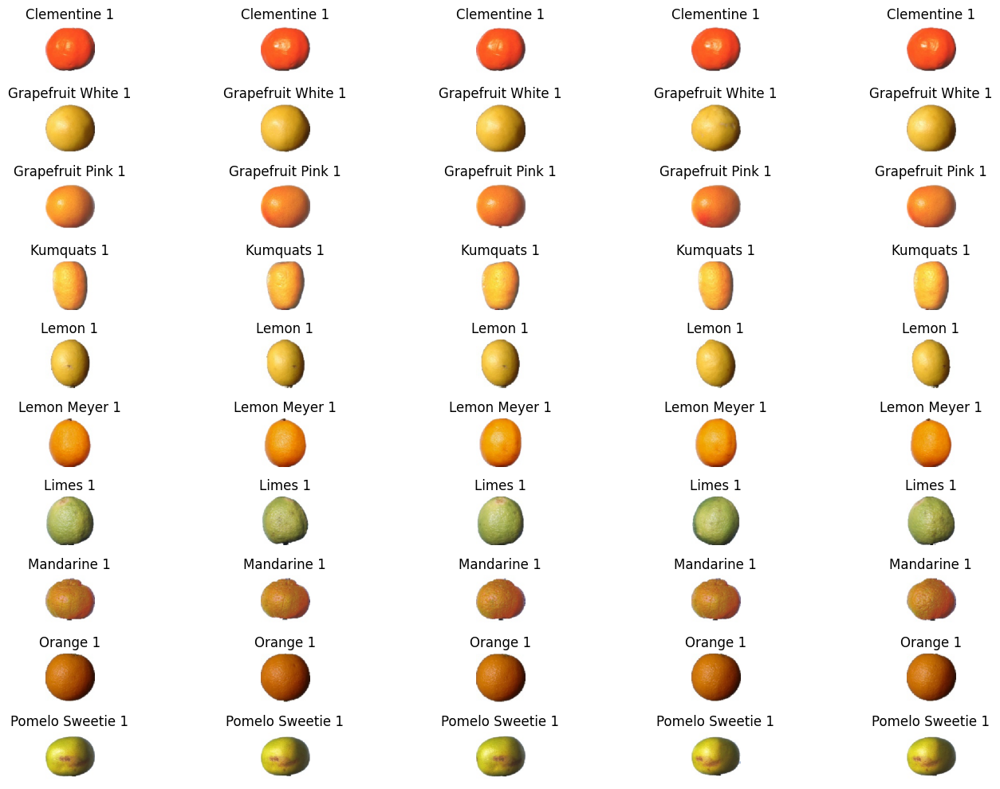

In [55]:
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras.preprocessing import image

# Folder utama dataset
base_dir = '/content/drive/MyDrive/ML /dataset PBL/Training/sitrus'

# Daftar nama kelas (folder)
classes = os.listdir(base_dir)
print("Kelas yang ditemukan:", classes)

# Jumlah contoh yang ingin ditampilkan per kelas
num_images = 5

plt.figure(figsize=(15, 10))

for i, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, class_name)
    # Ambil hanya sejumlah gambar yang ditentukan
    image_files = os.listdir(class_path)[:num_images]

    for j, img_name in enumerate(image_files):
        img_path = os.path.join(class_path, img_name)

        # 1. Memuat Gambar dan Mengubah Ukuran
        img = image.load_img(img_path, target_size=(128, 128))

        # 2. Konversi ke Array NumPy (Nilai piksel 0-255)
        img_array = image.img_to_array(img)

        # 3. Normalisasi Eksplisit: Mengubah rentang nilai piksel dari 0-255 menjadi 0.0-1.0
        # Normalisasi ini penting untuk pelatihan model Deep Learning yang stabil.
        img_array = img_array / 255.0

        plt.subplot(len(classes), num_images, i*num_images + j + 1)
        plt.imshow(img_array)
        plt.title(class_name)
        plt.axis('off')

plt.tight_layout()
plt.show()

In [86]:
import cv2
import numpy as np
import os

def extract_color_histogram(image_path, bins=(8, 8, 8)):
    # Baca gambar dan konversi ke HSV
    image = cv2.imread(image_path)
    if image is None:
        # Return None to indicate failure to read image
        return None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Hitung histogram di tiap channel (H, S, V)
    hist = cv2.calcHist([image], [0, 1, 2], None, bins,
                        [0, 180, 0, 256, 0, 256])

    # Normalisasi histogram agar konsisten
    cv2.normalize(hist, hist)

    return hist.flatten()

In [87]:
from skimage.feature import local_binary_pattern

def extract_lbp_features(image_path, P=8, R=1):
    # Baca gambar dalam grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        # Return None to indicate failure to read image
        return None

    # Hitung pola LBP
    lbp = local_binary_pattern(image, P, R, method="uniform")

    # Hitung histogram dari pola LBP
    (hist, _) = np.histogram(lbp.ravel(),
                             bins=np.arange(0, P + 3),
                             range=(0, P + 2))

    # Normalisasi histogram
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)

    return hist

In [88]:
def extract_combined_features(image_path):
    color_features = extract_color_histogram(image_path)
    if color_features is None:
        return None
    texture_features = extract_lbp_features(image_path)
    if texture_features is None:
        return None # Handle case if LBP feature extraction also fails
    combined = np.hstack([color_features, texture_features])
    return combined

In [65]:
from tqdm import tqdm

base_dir = '/content/drive/MyDrive/ML /dataset PBL/Training/melon'
classes = sorted(os.listdir(base_dir))

X = []
y = []

for label, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, class_name)
    image_files = os.listdir(class_path)

    for img_name in tqdm(image_files, desc=f"Ekstraksi {class_name}"):
        img_path = os.path.join(class_path, img_name)
        features = extract_combined_features(img_path)
        X.append(features)
        y.append(label)

X = np.array(X)
y = np.array(y)

print("Shape fitur:", X.shape)


Ekstraksi Melon Piel de Sapo 1: 100%|██████████| 738/738 [00:24<00:00, 29.57it/s]

Shape fitur: (1722, 522)


In [67]:
from tqdm import tqdm

base_dir = '/content/drive/MyDrive/ML /dataset PBL/Training/kacang'
classes = sorted(os.listdir(base_dir))

X = []
y = []

for label, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, class_name)
    image_files = os.listdir(class_path)

    for img_name in tqdm(image_files, desc=f"Ekstraksi {class_name}"):
        img_path = os.path.join(class_path, img_name)
        features = extract_combined_features(img_path)
        X.append(features)
        y.append(label)

X = np.array(X)
y = np.array(y)

print("Shape fitur:", X.shape)


Ekstraksi Walnut 1: 100%|██████████| 735/735 [00:17<00:00, 40.90it/s]

Shape fitur: (4252, 522)



=== Menampilkan Gambar Asli, Citra LBP, dan Fitur Haralick Numerik ===


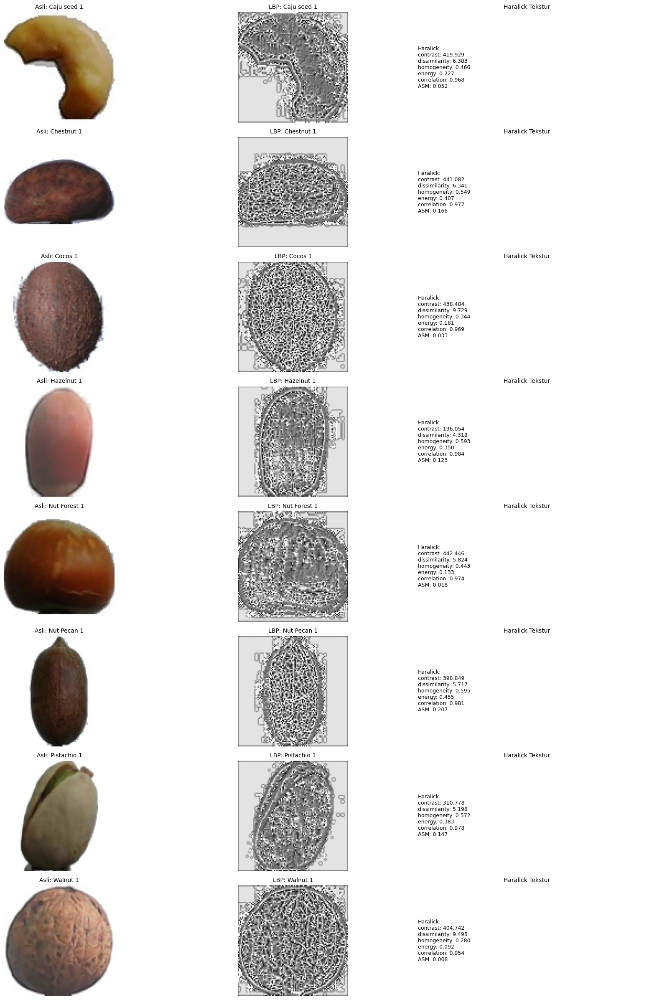

In [75]:
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras.preprocessing import image
from skimage.feature import local_binary_pattern, graycomatrix, graycoprops
from skimage.color import rgb2gray
from skimage import io
import cv2 # Untuk fungsi konversi gambar jika diperlukan

# Folder utama dataset
base_dir = '/content/drive/MyDrive/ML /dataset PBL/Training/kacang'

# Daftar nama kelas (folder)
classes = sorted(os.listdir(base_dir))

# --- Parameter untuk Ekstraksi Fitur ---
# Untuk LBP
radius = 1
n_points = 8 * radius

# Untuk GLCM (Haralick Textures)
distances = [1] # Jarak piksel yang dipertimbangkan
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4] # Sudut (0, 45, 90, 135 derajat)
properties = ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM']

# Jumlah sampel untuk visualisasi per kelas
num_samples_to_show = 1

print("\n=== Menampilkan Gambar Asli, Citra LBP, dan Fitur Haralick Numerik ===")

plt.figure(figsize=(18, len(classes) * 3)) # Sesuaikan ukuran figure

current_plot_row = 0

for i, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, class_name)
    image_files = os.listdir(class_path)[:num_samples_to_show]

    for j, img_name in enumerate(image_files):
        img_path = os.path.join(class_path, img_name)

        # 1. Muat dan Preprocessing Gambar
        # Memuat gambar asli
        original_img_color = io.imread(img_path)
        # Konversi ke grayscale untuk LBP dan GLCM
        original_img_gray = rgb2gray(original_img_color)
        # Rescale ke 0-255 jika rgb2gray mengembalikan 0-1 (skimage melakukan ini)
        original_img_gray_255 = (original_img_gray * 255).astype(np.uint8)

        # Jika gambar masih berukuran besar, lakukan resize agar lebih cepat
        # target_size = (200, 200)
        # original_img_color = cv2.resize(original_img_color, target_size)
        # original_img_gray_255 = cv2.resize(original_img_gray_255, target_size)

        # --- Ekstraksi LBP ---
        lbp_image = local_binary_pattern(original_img_gray_255, n_points, radius, method='uniform')

        # --- Ekstraksi Haralick Textures (GLCM) ---
        # Untuk GLCM, pastikan citra 8-bit
        glcm = graycomatrix(original_img_gray_255,
                            distances=distances,
                            angles=angles,
                            levels=256,
                            symmetric=True,
                            normed=True)
        haralick_features = {}
        for prop in properties:
            haralick_features[prop] = graycoprops(glcm, prop).mean() # Rata-rata dari semua sudut

        # --- Visualisasi ---

        # Plot Gambar Asli
        plt.subplot(len(classes) * num_samples_to_show, 3, current_plot_row * 3 + 1)
        plt.imshow(original_img_color)
        plt.title(f"Asli: {class_name}", fontsize=10)
        plt.axis('off')

        # Plot Citra LBP
        plt.subplot(len(classes) * num_samples_to_show, 3, current_plot_row * 3 + 2)
        plt.imshow(lbp_image, cmap='gray') # LBP biasanya ditampilkan dalam grayscale
        plt.title(f"LBP: {class_name}", fontsize=10)
        plt.axis('off')

        # Tampilkan Nilai Haralick (Teks)
        plt.subplot(len(classes) * num_samples_to_show, 3, current_plot_row * 3 + 3)
        plt.axis('off')
        haralick_text = "\n".join([f"{k}: {v:.3f}" for k, v in haralick_features.items()])
        plt.text(0.1, 0.5, f"Haralick:\n{haralick_text}", fontsize=9,
                 verticalalignment='center', horizontalalignment='left')
        plt.title(f"Haralick Tekstur", fontsize=10)

        current_plot_row += 1

plt.tight_layout()
plt.show()


=== Menampilkan Gambar Asli dan Histogram Warna RGB ===


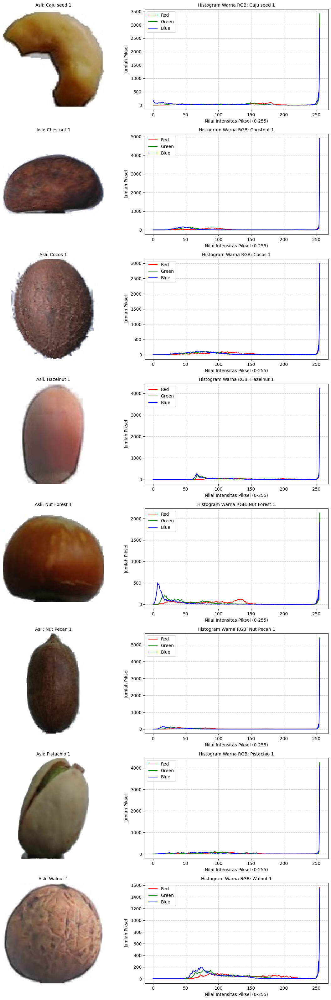

In [77]:
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage.io import imread
import cv2
# cv2 digunakan di sini karena memiliki fungsi perhitungan histogram yang sangat efisien

# Folder utama dataset
base_dir = '/content/drive/MyDrive/ML /dataset PBL/Training/kacang'

# Daftar nama kelas (folder)
classes = sorted(os.listdir(base_dir))

# Jumlah sampel untuk visualisasi per kelas
num_samples_to_show = 1

print("\n=== Menampilkan Gambar Asli dan Histogram Warna RGB ===")

# Figure besar untuk menampung semua plot: 2 kolom (Gambar Asli, Histogram)
plt.figure(figsize=(12, len(classes) * 4))

current_plot_row = 0

for i, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, class_name)
    image_files = os.listdir(class_path)[:num_samples_to_show]

    for j, img_name in enumerate(image_files):
        img_path = os.path.join(class_path, img_name)

        # 1. Muat Gambar (menggunakan cv2 untuk kemudahan perhitungan histogram)
        # cv2.IMREAD_COLOR memastikan gambar dimuat dalam format warna
        img_bgr = cv2.imread(img_path, cv2.IMREAD_COLOR)

        # Konversi BGR (OpenCV default) ke RGB untuk tampilan Matplotlib
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        # 2. Hitung Histogram untuk Setiap Saluran (R, G, B)
        # Parameter: [image], [channels], mask, [histSize], [ranges]
        hist_r = cv2.calcHist([img_bgr], [2], None, [256], [0, 256]) # R (index 2 di BGR)
        hist_g = cv2.calcHist([img_bgr], [1], None, [256], [0, 256]) # G (index 1 di BGR)
        hist_b = cv2.calcHist([img_bgr], [0], None, [256], [0, 256]) # B (index 0 di BGR)

        # --- Visualisasi ---

        # Plot Gambar Asli
        plt.subplot(len(classes) * num_samples_to_show, 2, current_plot_row * 2 + 1)
        plt.imshow(img_rgb)
        plt.title(f"Asli: {class_name}", fontsize=10)
        plt.axis('off')

        # Plot Histogram Warna
        plt.subplot(len(classes) * num_samples_to_show, 2, current_plot_row * 2 + 2)

        # Plot setiap saluran
        plt.plot(hist_r, color='red', label='Red')
        plt.plot(hist_g, color='green', label='Green')
        plt.plot(hist_b, color='blue', label='Blue')

        plt.title(f"Histogram Warna RGB: {class_name}", fontsize=10)
        plt.xlabel("Nilai Intensitas Piksel (0-255)")
        plt.ylabel("Jumlah Piksel")
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)

        current_plot_row += 1

plt.tight_layout()
plt.show()


=== Menampilkan Gambar Asli, Citra LBP, dan Fitur Haralick Numerik ===


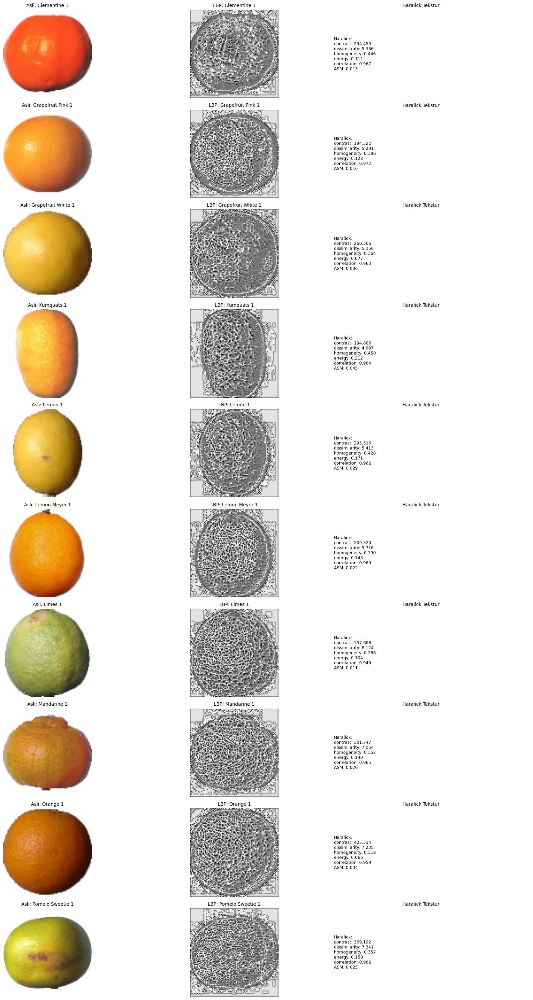

In [78]:
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras.preprocessing import image
from skimage.feature import local_binary_pattern, graycomatrix, graycoprops
from skimage.color import rgb2gray
from skimage import io
import cv2 # Untuk fungsi konversi gambar jika diperlukan

# Folder utama dataset
base_dir = '/content/drive/MyDrive/ML /dataset PBL/Training/sitrus'

# Daftar nama kelas (folder)
classes = sorted(os.listdir(base_dir))

# --- Parameter untuk Ekstraksi Fitur ---
# Untuk LBP
radius = 1
n_points = 8 * radius

# Untuk GLCM (Haralick Textures)
distances = [1] # Jarak piksel yang dipertimbangkan
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4] # Sudut (0, 45, 90, 135 derajat)
properties = ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM']

# Jumlah sampel untuk visualisasi per kelas
num_samples_to_show = 1

print("\n=== Menampilkan Gambar Asli, Citra LBP, dan Fitur Haralick Numerik ===")

plt.figure(figsize=(18, len(classes) * 3)) # Sesuaikan ukuran figure

current_plot_row = 0

for i, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, class_name)
    image_files = os.listdir(class_path)[:num_samples_to_show]

    for j, img_name in enumerate(image_files):
        img_path = os.path.join(class_path, img_name)

        # 1. Muat dan Preprocessing Gambar
        # Memuat gambar asli
        original_img_color = io.imread(img_path)
        # Konversi ke grayscale untuk LBP dan GLCM
        original_img_gray = rgb2gray(original_img_color)
        # Rescale ke 0-255 jika rgb2gray mengembalikan 0-1 (skimage melakukan ini)
        original_img_gray_255 = (original_img_gray * 255).astype(np.uint8)

        # Jika gambar masih berukuran besar, lakukan resize agar lebih cepat
        # target_size = (200, 200)
        # original_img_color = cv2.resize(original_img_color, target_size)
        # original_img_gray_255 = cv2.resize(original_img_gray_255, target_size)

        # --- Ekstraksi LBP ---
        lbp_image = local_binary_pattern(original_img_gray_255, n_points, radius, method='uniform')

        # --- Ekstraksi Haralick Textures (GLCM) ---
        # Untuk GLCM, pastikan citra 8-bit
        glcm = graycomatrix(original_img_gray_255,
                            distances=distances,
                            angles=angles,
                            levels=256,
                            symmetric=True,
                            normed=True)
        haralick_features = {}
        for prop in properties:
            haralick_features[prop] = graycoprops(glcm, prop).mean() # Rata-rata dari semua sudut

        # --- Visualisasi ---

        # Plot Gambar Asli
        plt.subplot(len(classes) * num_samples_to_show, 3, current_plot_row * 3 + 1)
        plt.imshow(original_img_color)
        plt.title(f"Asli: {class_name}", fontsize=10)
        plt.axis('off')

        # Plot Citra LBP
        plt.subplot(len(classes) * num_samples_to_show, 3, current_plot_row * 3 + 2)
        plt.imshow(lbp_image, cmap='gray') # LBP biasanya ditampilkan dalam grayscale
        plt.title(f"LBP: {class_name}", fontsize=10)
        plt.axis('off')

        # Tampilkan Nilai Haralick (Teks)
        plt.subplot(len(classes) * num_samples_to_show, 3, current_plot_row * 3 + 3)
        plt.axis('off')
        haralick_text = "\n".join([f"{k}: {v:.3f}" for k, v in haralick_features.items()])
        plt.text(0.1, 0.5, f"Haralick:\n{haralick_text}", fontsize=9,
                 verticalalignment='center', horizontalalignment='left')
        plt.title(f"Haralick Tekstur", fontsize=10)

        current_plot_row += 1

plt.tight_layout()
plt.show()


=== Menampilkan Gambar Asli dan Histogram Warna RGB ===


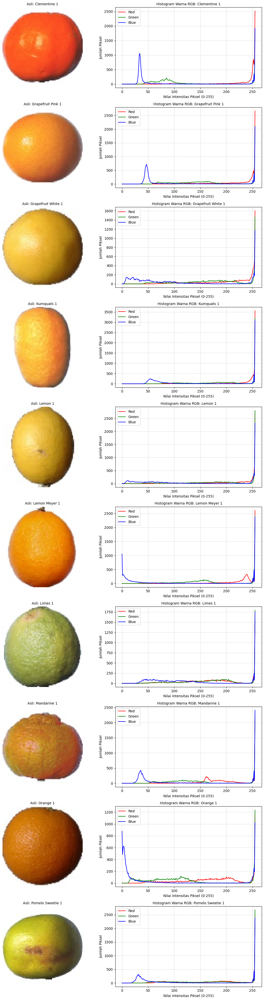

In [79]:
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage.io import imread
import cv2
# cv2 digunakan di sini karena memiliki fungsi perhitungan histogram yang sangat efisien

# Folder utama dataset
base_dir = '/content/drive/MyDrive/ML /dataset PBL/Training/sitrus'

# Daftar nama kelas (folder)
classes = sorted(os.listdir(base_dir))

# Jumlah sampel untuk visualisasi per kelas
num_samples_to_show = 1

print("\n=== Menampilkan Gambar Asli dan Histogram Warna RGB ===")

# Figure besar untuk menampung semua plot: 2 kolom (Gambar Asli, Histogram)
plt.figure(figsize=(12, len(classes) * 4))

current_plot_row = 0

for i, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, class_name)
    image_files = os.listdir(class_path)[:num_samples_to_show]

    for j, img_name in enumerate(image_files):
        img_path = os.path.join(class_path, img_name)

        # 1. Muat Gambar (menggunakan cv2 untuk kemudahan perhitungan histogram)
        # cv2.IMREAD_COLOR memastikan gambar dimuat dalam format warna
        img_bgr = cv2.imread(img_path, cv2.IMREAD_COLOR)

        # Konversi BGR (OpenCV default) ke RGB untuk tampilan Matplotlib
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        # 2. Hitung Histogram untuk Setiap Saluran (R, G, B)
        # Parameter: [image], [channels], mask, [histSize], [ranges]
        hist_r = cv2.calcHist([img_bgr], [2], None, [256], [0, 256]) # R (index 2 di BGR)
        hist_g = cv2.calcHist([img_bgr], [1], None, [256], [0, 256]) # G (index 1 di BGR)
        hist_b = cv2.calcHist([img_bgr], [0], None, [256], [0, 256]) # B (index 0 di BGR)

        # --- Visualisasi ---

        # Plot Gambar Asli
        plt.subplot(len(classes) * num_samples_to_show, 2, current_plot_row * 2 + 1)
        plt.imshow(img_rgb)
        plt.title(f"Asli: {class_name}", fontsize=10)
        plt.axis('off')

        # Plot Histogram Warna
        plt.subplot(len(classes) * num_samples_to_show, 2, current_plot_row * 2 + 2)

        # Plot setiap saluran
        plt.plot(hist_r, color='red', label='Red')
        plt.plot(hist_g, color='green', label='Green')
        plt.plot(hist_b, color='blue', label='Blue')

        plt.title(f"Histogram Warna RGB: {class_name}", fontsize=10)
        plt.xlabel("Nilai Intensitas Piksel (0-255)")
        plt.ylabel("Jumlah Piksel")
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)

        current_plot_row += 1

plt.tight_layout()
plt.show()


=== Menampilkan Gambar Asli, Citra LBP, dan Fitur Haralick Numerik ===


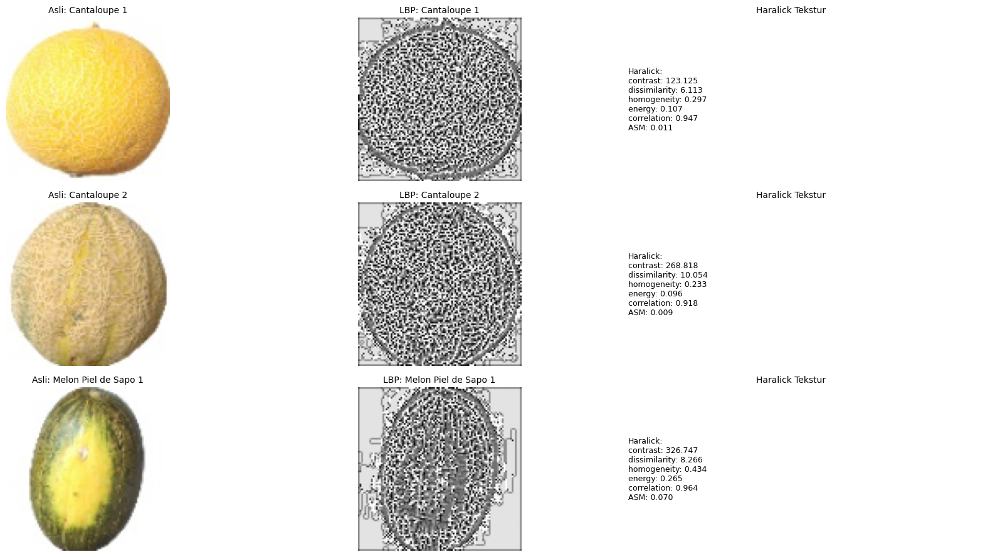

In [81]:
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras.preprocessing import image
from skimage.feature import local_binary_pattern, graycomatrix, graycoprops
from skimage.color import rgb2gray
from skimage import io
import cv2 # Untuk fungsi konversi gambar jika diperlukan

# Folder utama dataset
base_dir = '/content/drive/MyDrive/ML /dataset PBL/Training/melon'

# Daftar nama kelas (folder)
classes = sorted(os.listdir(base_dir))

# --- Parameter untuk Ekstraksi Fitur ---
# Untuk LBP
radius = 1
n_points = 8 * radius

# Untuk GLCM (Haralick Textures)
distances = [1] # Jarak piksel yang dipertimbangkan
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4] # Sudut (0, 45, 90, 135 derajat)
properties = ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM']

# Jumlah sampel untuk visualisasi per kelas
num_samples_to_show = 1

print("\n=== Menampilkan Gambar Asli, Citra LBP, dan Fitur Haralick Numerik ===")

plt.figure(figsize=(18, len(classes) * 3)) # Sesuaikan ukuran figure

current_plot_row = 0

for i, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, class_name)
    image_files = os.listdir(class_path)[:num_samples_to_show]

    for j, img_name in enumerate(image_files):
        img_path = os.path.join(class_path, img_name)

        # 1. Muat dan Preprocessing Gambar
        # Memuat gambar asli
        original_img_color = io.imread(img_path)
        # Konversi ke grayscale untuk LBP dan GLCM
        original_img_gray = rgb2gray(original_img_color)
        # Rescale ke 0-255 jika rgb2gray mengembalikan 0-1 (skimage melakukan ini)
        original_img_gray_255 = (original_img_gray * 255).astype(np.uint8)

        # Jika gambar masih berukuran besar, lakukan resize agar lebih cepat
        # target_size = (200, 200)
        # original_img_color = cv2.resize(original_img_color, target_size)
        # original_img_gray_255 = cv2.resize(original_img_gray_255, target_size)

        # --- Ekstraksi LBP ---
        lbp_image = local_binary_pattern(original_img_gray_255, n_points, radius, method='uniform')

        # --- Ekstraksi Haralick Textures (GLCM) ---
        # Untuk GLCM, pastikan citra 8-bit
        glcm = graycomatrix(original_img_gray_255,
                            distances=distances,
                            angles=angles,
                            levels=256,
                            symmetric=True,
                            normed=True)
        haralick_features = {}
        for prop in properties:
            haralick_features[prop] = graycoprops(glcm, prop).mean() # Rata-rata dari semua sudut

        # --- Visualisasi ---

        # Plot Gambar Asli
        plt.subplot(len(classes) * num_samples_to_show, 3, current_plot_row * 3 + 1)
        plt.imshow(original_img_color)
        plt.title(f"Asli: {class_name}", fontsize=10)
        plt.axis('off')

        # Plot Citra LBP
        plt.subplot(len(classes) * num_samples_to_show, 3, current_plot_row * 3 + 2)
        plt.imshow(lbp_image, cmap='gray') # LBP biasanya ditampilkan dalam grayscale
        plt.title(f"LBP: {class_name}", fontsize=10)
        plt.axis('off')

        # Tampilkan Nilai Haralick (Teks)
        plt.subplot(len(classes) * num_samples_to_show, 3, current_plot_row * 3 + 3)
        plt.axis('off')
        haralick_text = "\n".join([f"{k}: {v:.3f}" for k, v in haralick_features.items()])
        plt.text(0.1, 0.5, f"Haralick:\n{haralick_text}", fontsize=9,
                 verticalalignment='center', horizontalalignment='left')
        plt.title(f"Haralick Tekstur", fontsize=10)

        current_plot_row += 1

plt.tight_layout()
plt.show()


=== Menampilkan Gambar Asli dan Histogram Warna RGB ===


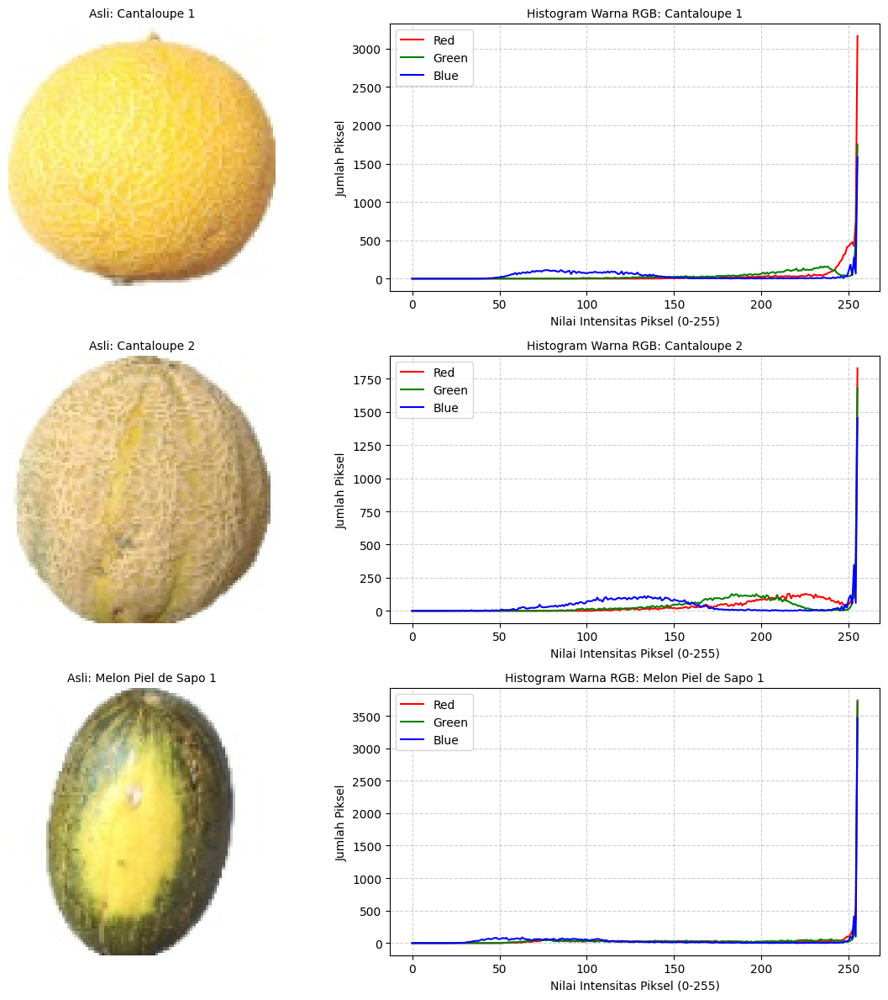

In [80]:
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage.io import imread
import cv2
# cv2 digunakan di sini karena memiliki fungsi perhitungan histogram yang sangat efisien

# Folder utama dataset
base_dir = '/content/drive/MyDrive/ML /dataset PBL/Training/melon'

# Daftar nama kelas (folder)
classes = sorted(os.listdir(base_dir))

# Jumlah sampel untuk visualisasi per kelas
num_samples_to_show = 1

print("\n=== Menampilkan Gambar Asli dan Histogram Warna RGB ===")

# Figure besar untuk menampung semua plot: 2 kolom (Gambar Asli, Histogram)
plt.figure(figsize=(12, len(classes) * 4))

current_plot_row = 0

for i, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, class_name)
    image_files = os.listdir(class_path)[:num_samples_to_show]

    for j, img_name in enumerate(image_files):
        img_path = os.path.join(class_path, img_name)

        # 1. Muat Gambar (menggunakan cv2 untuk kemudahan perhitungan histogram)
        # cv2.IMREAD_COLOR memastikan gambar dimuat dalam format warna
        img_bgr = cv2.imread(img_path, cv2.IMREAD_COLOR)

        # Konversi BGR (OpenCV default) ke RGB untuk tampilan Matplotlib
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        # 2. Hitung Histogram untuk Setiap Saluran (R, G, B)
        # Parameter: [image], [channels], mask, [histSize], [ranges]
        hist_r = cv2.calcHist([img_bgr], [2], None, [256], [0, 256]) # R (index 2 di BGR)
        hist_g = cv2.calcHist([img_bgr], [1], None, [256], [0, 256]) # G (index 1 di BGR)
        hist_b = cv2.calcHist([img_bgr], [0], None, [256], [0, 256]) # B (index 0 di BGR)

        # --- Visualisasi ---

        # Plot Gambar Asli
        plt.subplot(len(classes) * num_samples_to_show, 2, current_plot_row * 2 + 1)
        plt.imshow(img_rgb)
        plt.title(f"Asli: {class_name}", fontsize=10)
        plt.axis('off')

        # Plot Histogram Warna
        plt.subplot(len(classes) * num_samples_to_show, 2, current_plot_row * 2 + 2)

        # Plot setiap saluran
        plt.plot(hist_r, color='red', label='Red')
        plt.plot(hist_g, color='green', label='Green')
        plt.plot(hist_b, color='blue', label='Blue')

        plt.title(f"Histogram Warna RGB: {class_name}", fontsize=10)
        plt.xlabel("Nilai Intensitas Piksel (0-255)")
        plt.ylabel("Jumlah Piksel")
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)

        current_plot_row += 1

plt.tight_layout()
plt.show()

In [ ]:
# Import pustaka jika belum ada
import numpy as np
import os
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
# ... (impor model klasifikasi yang akan digunakan, misal: SVC)

# --- Path Dataset ---
base_dir_train = '/content/drive/MyDrive/ML /dataset PBL/Training/sitrus'
base_dir_test = '/content/drive/MyDrive/ML /dataset PBL/Test/sitrus'

EXPECTED_FEATURE_DIM = 522 # 512 from color histogram + 10 from LBP histogram

# 1. Ekstraksi Data TRAINING
X_train_list = []
y_train_list = []
classes = sorted(os.listdir(base_dir_train)) # Ambil label dari folder Training

print("Memulai Ekstraksi Fitur Data TRAINING...")
for label, class_name in enumerate(classes):
    class_path = os.path.join(base_dir_train, class_name)
    image_files = os.listdir(class_path)

    # Menggunakan tqdm untuk progress bar
    for img_name in tqdm(image_files, desc=f"Ekstraksi Training {class_name}"):
        img_path = os.path.join(class_path, img_name)

        # Add a check to ensure it's a file and not a directory
        if os.path.isfile(img_path):
            features = extract_combined_features(img_path) # USE ACTUAL FEATURE EXTRACTION
            if features is not None:
                try:
                    # Explicitly convert to a float32 numpy array and verify its shape
                    features_arr = np.array(features, dtype=np.float32)
                    if features_arr.ndim == 1 and features_arr.shape[0] == EXPECTED_FEATURE_DIM:
                        X_train_list.append(features_arr)
                        y_train_list.append(label)
                    else:
                        print(f"DEBUG: {img_name} in {class_name} has unexpected feature dimension: {features_arr.shape}. Expected 1D array of length {EXPECTED_FEATURE_DIM}.")
                except Exception as e:
                    print(f"DEBUG: Error converting or checking features for {img_name} in {class_name}: {e}")
            else:
                print(f"DEBUG: Could not extract features (returned None) for {img_name} in {class_name}.")

# Konversi ke NumPy Array
X_train = np.array(X_train_list)
y_train = np.array(y_train_list)


# 2. Ekstraksi Data TESTING (Menggunakan label yang sama dari data Training)
X_test_list = []
y_test_list = []

print("Memulai Ekstraksi Fitur Data TESTING...")
for label, class_name in enumerate(classes): # Gunakan 'classes' yang sama
    class_path = os.path.join(base_dir_test, class_name)

    # ADDED: Check if the directory exists before trying to list its contents
    if not os.path.isdir(class_path):
        print(f"Warning: Test directory for class '{class_name}' not found: {class_path}. Skipping.")
        continue # Skip to the next class if directory does not exist

    image_files = os.listdir(class_path)

    for img_name in tqdm(image_files, desc=f"Ekstraksi Test {class_name}"):
        img_path = os.path.join(class_path, img_name)
        features = extract_combined_features(img_path) # USE ACTUAL FEATURE EXTRACTION
        if features is not None:
                try:
                    # Explicitly convert to a float32 numpy array and verify its shape
                    features_arr = np.array(features, dtype=np.float32)
                    if features_arr.ndim == 1 and features_arr.shape[0] == EXPECTED_FEATURE_DIM:
                        X_test_list.append(features_arr)
                        y_test_list.append(label)
                    else:
                        print(f"DEBUG: {img_name} in {class_name} has unexpected feature dimension: {features_arr.shape}. Expected 1D array of length {EXPECTED_FEATURE_DIM}.")
                except Exception as e:
                    print(f"DEBUG: Error converting or checking features for {img_name} in {class_name}: {e}")
            else:
                print(f"DEBUG: Could not extract features (returned None) for {img_name} in {class_name}.")

# Konversi ke NumPy Array
X_test = np.array(X_test_list)
y_test = np.array(y_test_list)

print(f"\nShape X_train: {X_train.shape}, Shape y_train: {y_train.shape}")
print(f"Shape X_test: {X_test.shape}, Shape y_test: {y_test.shape}")

In [91]:
# 1. Standardisasi Data
scaler = StandardScaler()
# Pelajari (fit) parameter scaling HANYA dari data training
X_train_scaled = scaler.fit_transform(X_train)
# Terapkan (transform) parameter scaling yang sama ke data testing
X_test_scaled = scaler.transform(X_test)

# 2. Reduksi Dimensi dengan PCA
# Asumsi kita ingin mempertahankan 90% variansi
pca = PCA(n_components=0.90)
# Pelajari (fit) komponen PCA HANYA dari data training
X_train_final = pca.fit_transform(X_train_scaled)
# Terapkan (transform) komponen PCA yang sama ke data testing
X_test_final = pca.transform(X_test_scaled)

print(f"\nShape X_train (Final): {X_train_final.shape}")
print(f"Shape X_test (Final): {X_test_final.shape}")


Shape X_train (Final): (4854, 431)
Shape X_test (Final): (1479, 431)


In [ ]:
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# 1. Definisikan Model dan Parameter Tuning
model = SVC(random_state=42) # Kita gunakan Support Vector Classifier sebagai contoh
param_grid = {
    'C': [0.1, 1, 10],            # Parameter Regularization
    'kernel': ['rbf', 'linear'],  # Jenis kernel
    'gamma': ['scale', 0.01, 0.1] # Parameter kernel untuk 'rbf'
}

# 2. Definisikan Strategi Cross-Validation
# KFold(n_splits=5) akan membagi data training menjadi 5 lipatan (fold)
cv_strategy = KFold(n_splits=5, shuffle=True, random_state=42)

# 3. Inisialisasi GridSearchCV
# cv=cv_strategy memastikan k=5 Cross-Validation
grid_search = GridSearchCV(estimator=model,
                           param_grid=param_grid,
                           cv=cv_strategy,
                           scoring='accuracy', # Metrik yang digunakan untuk memilih yang terbaik
                           verbose=2,
                           n_jobs=-1)

print("\nMemulai Hyperparameter Tuning dengan 5-fold Cross-Validation...")

# 4. Lakukan Tuning (Hanya pada data Training)
grid_search.fit(X_train_final, y_train)

# --- HASIL TUNING ---
print("\n=== Hasil Hyperparameter Tuning ===")
print("Hyperparameter Terbaik:", grid_search.best_params_)
print(f"Skor Cross-Validation Terbaik (Akurasi): {grid_search.best_score_:.4f}")

# 5. Model Akhir
# Ambil model terbaik hasil tuning
best_model = grid_search.best_estimator_


Memulai Hyperparameter Tuning dengan 5-fold Cross-Validation...
Fitting 5 folds for each of 18 candidates, totalling 90 fits


In [ ]:
print("\n=== Evaluasi Akhir Menggunakan Data Test (22k citra) ===")

# Prediksi menggunakan model terbaik pada data test yang sudah diproses
y_pred_test = best_model.predict(X_test_final)

# Tampilkan laporan klasifikasi
print(classification_report(y_test, y_pred_test, target_names=classes))